# Setup

In [1]:
from google.colab import files
files.upload()  # Upload your kaggle.json here.

from google.colab import drive
drive.mount('/content/gdrive')

!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

# !mkdir kaggle/
# %cd kaggle/
# !mkdir input/
# !mkdir output/
# %cd input/

!mkdir rsna-miccai-png
%cd rsna-miccai-png/
!kaggle datasets download -d jonathanbesomi/rsna-miccai-png
!unzip -q rsna-miccai-png.zip
!rm rsna-miccai-png.zip
%cd ../

# %cd output/

Saving kaggle.json to kaggle.json
Mounted at /content/gdrive
/content/rsna-miccai-png
100% 5.08G/5.08G [00:42<00:00, 104MB/s]
100% 5.08G/5.08G [00:42<00:00, 128MB/s]
/content


In [2]:
!pip install albumentations --upgrade -q
!pip install pydicom -q
!pip install timm -q
!pip install torch --upgrade -q
!pip install keras_applications -q
!pip install efficientnet-3D -q
!pip install git+https://github.com/shijianjian/EfficientNet-PyTorch-3D -q
!pip install classification-models-3D -q
!pip install volumentations-3D -q
!pip install --upgrade https://github.com/VincentStimper/mclahe/archive/numpy.zip -q

     |████████████████████████████████| 98 kB 5.7 MB/s 
     |████████████████████████████████| 37.1 MB 1.1 MB/s 
     |████████████████████████████████| 2.0 MB 28.8 MB/s 
     |████████████████████████████████| 376 kB 26.4 MB/s 
     |████████████████████████████████| 50 kB 6.3 MB/s 
     |████████████████████████████████| 45 kB 2.3 MB/s 
     / 7.5 MB 15.9 MB/s


In [3]:
# General imports.
import gc
import re
import sys
import PIL
import yaml
import math
import random
import pydicom
import platform
import shutil, os

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import albumentations as A
import volumentations as V
import mclahe as mc
import sklearn
import cv2
import timm
import torch
import torch.nn as nn
import torch.nn.functional as F
import tensorflow as tf

# Specific imports. 
from math import ceil
from glob import glob
from PIL import Image
from IPython.display import Image, clear_output
from pydicom.pixel_data_handlers.util import apply_voi_lut

from tqdm.notebook import tqdm
from albumentations.pytorch import ToTensorV2
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold
from tensorflow import keras
from efficientnet_3D import keras as efn  # TF.keras.
from efficientnet_pytorch_3d import EfficientNet3D  # Pytorch.
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from torchsummary import summary
from torchvision import transforms

import warnings
warnings.simplefilter('ignore')

In [4]:
# !pip install wandb -qqq
# import wandb
# # from wandb.keras import WandbCallback
# wandb.login()

# Utility Functions

In [5]:
def seed_everything(seed=123):
  random.seed(seed)
  os.environ['PYTHONHASHSEED'] = str(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)

# Hyperparameters

In [6]:
class Config:
  max_seq_length = 64
  threshold = 0.9
  filter_thr = 0.4
  image_size = 256

  # Permanent parameters.
  folds = 5
  classes = ["MGMT_value"]
  n_classes = len(classes)
  project_name = "RSNA-MICCAI-efnb0-3d_512"
  images_dir = "."
  seed_everything(123)

# Building the Dataset

In [7]:
root_path = r"/content/gdrive/MyDrive/Kaggle Competitions/RSNA-brain-tumor"

axial_FLAIR = pd.read_csv(os.path.join(root_path, "axial_FLAIR.csv"))
coronal_FLAIR = pd.read_csv(os.path.join(root_path, "coronal_FLAIR.csv"))
sagittal_FLAIR = pd.read_csv(os.path.join(root_path, "sagittal_FLAIR.csv"))

axial_T1w = pd.read_csv(os.path.join(root_path, "axial_T1w.csv"))
coronal_T1w = pd.read_csv(os.path.join(root_path, "coronal_T1w.csv"))
sagittal_T1w = pd.read_csv(os.path.join(root_path, "sagittal_T1w.csv"))

axial_T1wCE = pd.read_csv(os.path.join(root_path, "axial_T1wCE.csv"))
coronal_T1wCE = pd.read_csv(os.path.join(root_path, "coronal_T1wCE.csv"))
sagittal_T1wCE = pd.read_csv(os.path.join(root_path, "sagittal_T1wCE.csv"))

axial_T2w = pd.read_csv(os.path.join(root_path, "axial_T2w.csv"))
coronal_T2w = pd.read_csv(os.path.join(root_path, "coronal_T2w.csv"))
sagittal_T2w = pd.read_csv(os.path.join(root_path, "sagittal_T2w.csv"))

In [8]:
print(axial_FLAIR.shape, coronal_FLAIR.shape, sagittal_FLAIR.shape)
print(axial_T1w.shape, coronal_T1w.shape, sagittal_T1w.shape)
print(axial_T1wCE.shape, coronal_T1wCE.shape, sagittal_T1wCE.shape)
print(axial_T2w.shape, coronal_T2w.shape, sagittal_T2w.shape)

(17437, 14) (32886, 14) (3339, 14)
(56633, 14) (800, 14) (705, 14)
(63381, 14) (4649, 14) (2717, 14)
(15316, 14) (2439, 14) (52827, 14)


In [9]:
print(axial_FLAIR.PatientID.nunique(), coronal_FLAIR.PatientID.nunique(), sagittal_FLAIR.PatientID.nunique())
print(axial_T1w.PatientID.nunique(), coronal_T1w.PatientID.nunique(), sagittal_T1w.PatientID.nunique())
print(axial_T1wCE.PatientID.nunique(), coronal_T1wCE.PatientID.nunique(), sagittal_T1wCE.PatientID.nunique())
print(axial_T2w.PatientID.nunique(), coronal_T2w.PatientID.nunique(), sagittal_T2w.PatientID.nunique())

356 197 29
564 5 13
508 40 34
352 22 208


In [10]:
display(axial_FLAIR.MGMT_value.value_counts()), display(coronal_FLAIR.MGMT_value.value_counts()), display(sagittal_FLAIR.MGMT_value.value_counts())
display(axial_T1w.MGMT_value.value_counts()), display(coronal_T1w.MGMT_value.value_counts()), display(sagittal_T1w.MGMT_value.value_counts())
display(axial_T1wCE.MGMT_value.value_counts()), display(coronal_T1wCE.MGMT_value.value_counts()), display(sagittal_T1wCE.MGMT_value.value_counts())
display(axial_T2w.MGMT_value.value_counts()), display(coronal_T2w.MGMT_value.value_counts()), display(sagittal_T2w.MGMT_value.value_counts())

0    9219
1    8218
Name: MGMT_value, dtype: int64

1    21458
0    11428
Name: MGMT_value, dtype: int64

0    1707
1    1632
Name: MGMT_value, dtype: int64

1    29709
0    26924
Name: MGMT_value, dtype: int64

1    630
0    170
Name: MGMT_value, dtype: int64

0    640
1     65
Name: MGMT_value, dtype: int64

1    33503
0    29878
Name: MGMT_value, dtype: int64

1    2841
0    1808
Name: MGMT_value, dtype: int64

1    1746
0     971
Name: MGMT_value, dtype: int64

0    8043
1    7273
Name: MGMT_value, dtype: int64

1    1597
0     842
Name: MGMT_value, dtype: int64

1    33131
0    19696
Name: MGMT_value, dtype: int64

(None, None, None)

In [11]:
print(axial_FLAIR[axial_FLAIR.MGMT_value == 0].PatientID.nunique(), axial_FLAIR[axial_FLAIR.MGMT_value == 1].PatientID.nunique())
print(axial_T1w[axial_T1w.MGMT_value == 0].PatientID.nunique(), axial_T1w[axial_T1w.MGMT_value == 1].PatientID.nunique())
print(axial_T1wCE[axial_T1wCE.MGMT_value == 0].PatientID.nunique(), axial_T1wCE[axial_T1wCE.MGMT_value == 1].PatientID.nunique())
print(axial_T2w[axial_T2w.MGMT_value == 0].PatientID.nunique(), axial_T2w[axial_T2w.MGMT_value == 1].PatientID.nunique())
print("")

print(coronal_FLAIR[coronal_FLAIR.MGMT_value == 0].PatientID.nunique(), coronal_FLAIR[coronal_FLAIR.MGMT_value == 1].PatientID.nunique())
print(coronal_T1w[coronal_T1w.MGMT_value == 0].PatientID.nunique(), coronal_T1w[coronal_T1w.MGMT_value == 1].PatientID.nunique())
print(coronal_T1wCE[coronal_T1wCE.MGMT_value == 0].PatientID.nunique(), coronal_T1wCE[coronal_T1wCE.MGMT_value == 1].PatientID.nunique())
print(coronal_T2w[coronal_T2w.MGMT_value == 0].PatientID.nunique(), coronal_T2w[coronal_T2w.MGMT_value == 1].PatientID.nunique())
print("")

print(sagittal_FLAIR[sagittal_FLAIR.MGMT_value == 0].PatientID.nunique(), sagittal_FLAIR[sagittal_FLAIR.MGMT_value == 1].PatientID.nunique())
print(sagittal_T1w[sagittal_T1w.MGMT_value == 0].PatientID.nunique(), sagittal_T1w[sagittal_T1w.MGMT_value == 1].PatientID.nunique())
print(sagittal_T1wCE[sagittal_T1wCE.MGMT_value == 0].PatientID.nunique(), sagittal_T1wCE[sagittal_T1wCE.MGMT_value == 1].PatientID.nunique())
print(sagittal_T2w[sagittal_T2w.MGMT_value == 0].PatientID.nunique(), sagittal_T2w[sagittal_T2w.MGMT_value == 1].PatientID.nunique())

189 167
265 299
250 258
189 163

71 126
1 4
14 26
8 14

16 13
10 3
12 22
79 129


In [18]:
class PlaneModalityDataset(Dataset):
    def __init__(self, df, images_dir, image_size, mode, classes, max_seq_length=150, by_ratio=True, threshold=0.9, filter_thr=0.4):
        super(PlaneModalityDataset, self).__init__()
        self.df = df.reset_index(drop=True)
        self.images_dir = images_dir
        self.image_size = image_size
        assert mode in ['train', 'valid']
        self.mode = mode
        self.classes = classes
        self.max_seq_length = max_seq_length
        self.by_ratio = by_ratio
        self.threshold = threshold
        self.filter_thr = filter_thr

        self.patient_ids = self.df.PatientID.sort_values().reset_index(drop=True).unique()

        self.resize2d = A.Compose([
              A.Resize(self.image_size, self.image_size),
        ])

        if self.mode == 'train':
            # self.df = self.df.sample(frac=1).reset_index(drop=True)
            self.transform = V.Compose([
              
            ])
            
        else:
            self.transform = V.Compose([
            ])

    def filter_images_by_ratio(self, img_list, img_size, threshold=0.9):
      final = []
      for img in img_list:
          if (np.count_nonzero(img == 0) / img_size**2) < threshold:
              final.append(img)
          elif (np.count_nonzero(img == 0) / img_size**2) == 1:
              final.append(img)
              
      return np.array(final)

    def filter_images_by_mean(self, voxel, filter_thr):
        voxel_mean = voxel.mean(axis=(1, 2))
        keep = (voxel_mean > voxel_mean.std()*filter_thr)
        voxel = voxel[keep, :, :]
        return np.array(voxel)

    def trim_empty_spaces(self, img_list, img_size):
      trimmed_list = []
      for img in img_list:
          try:
              trimmed = img[~np.all(img == 0, axis=1)]
              trimmed = trimmed.T[~np.all(trimmed.T == 0, axis=1)]
              trimmed = trimmed.T

              trimmed = cv2.resize(trimmed, (img_size, img_size))
              trimmed_list.append(trimmed)
          except Exception as e:
              pass
          
      return np.array(trimmed_list)

    def clahe_3d(self, voxel):
        voxel = mc.mclahe(voxel, kernel_size=[8,32,32],
                  n_bins=128,
                  clip_limit=0.01,
                  adaptive_hist_range=False)
        return (voxel*255.0).astype(np.uint8).clip(0, 255)

    def __len__(self):
        return len(self.patient_ids)

    def __getitem__(self, index):
          patientid = self.patient_ids[index]
          df_sliced_by_patientid = (self.df[self.df.PatientID == patientid]
                                    .reset_index(drop=True)
                                    .sort_values(by="ImageID", key=lambda x: pd.Series([int(y.split("-")[-1]) for y in x.values])))

          images = []
          for idx, row in df_sliced_by_patientid.iterrows():
            image = cv2.imread(row.png_filepath, cv2.IMREAD_GRAYSCALE)
            image = self.resize2d(image=image)['image']
            images.append(image)

          images = self.filter_images_by_ratio(images, 
                                               self.image_size, 
                                               threshold=self.threshold) if self.by_ratio else self.filter_images_by_mean(np.array(images), 
                                                                                                                     self.filter_thr)
          images = self.trim_empty_spaces(images, self.image_size)

          images = (np.array(images)/255.0).astype(np.float32)
          images = self.clahe_3d(np.array(images))

          images_final = []
          for image in images:
            images_final.append(image)

          # Suggestion: maybe we can iterate through in reverse order.
          if len(images_final) < self.max_seq_length:
            for image in images_final:
              images_final.append(image)
              if len(images_final) == self.max_seq_length:
                break
          elif len(images_final) > self.max_seq_length:
            images_final = images_final[:self.max_seq_length]

          # image = torch.mean(torch.stack(images), dim=0)
          label = torch.FloatTensor(df_sliced_by_patientid.loc[0, self.classes])
          return (np.array(images_final)/255.0).astype(np.float32), label

In [19]:
cfg = Config()
exp_ds = PlaneModalityDataset(df=sagittal_T1w, 
                         images_dir=cfg.images_dir, 
                         image_size=cfg.image_size, 
                         mode="train", 
                         classes=cfg.classes, 
                         max_seq_length=cfg.max_seq_length, 
                         threshold=cfg.threshold,
                         by_ratio=True)

In [20]:
from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//24)

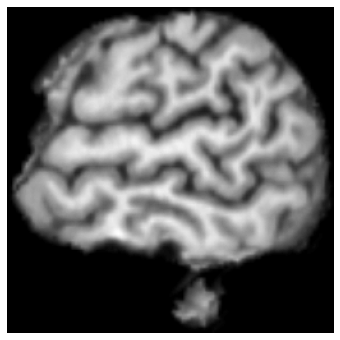

In [21]:
create_animation(exp_ds[0][0])

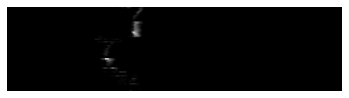

In [26]:
tfm = V.Compose([
  V.Flip(axis=0, p=0.5),
  V.Flip(axis=1, p=0.5),
  V.Flip(axis=2, p=0.5),
  V.RandomRotate90(axes=(0, 1), p=1.0),
  V.RandomGamma(p=1.0),
])

voxels = tfm(image=exp_ds[0][0].transpose(0, 1, 2))["image"]
create_animation(voxels)

In [ ]:
for idx, x in enumerate(range(len(exp_ds))):
  print(idx, exp_ds[x].shape)

# Building the Model (Experimental)

In [ ]:
from efficientnet_pytorch_3d import EfficientNet3D

model = EfficientNet3D.from_name("efficientnet-b0", override_params={'num_classes': 1}, in_channels=1)


In [ ]:
x = torch.rand((1, 1, 200, 200, 200))
with torch.no_grad():
  y = model(x)

In [ ]:
y

tensor([[0.0595]])

In [ ]:
x = torch.rand((1, 1, 200, 200, 200))
with torch.no_grad():
  y = model(x)

In [ ]:
model()